In [1]:
ENV = 'VAST' # VAST, Kaggle

In [2]:
import pandas as pd
import numpy as np
import os

import ast

import cv2
import time
import shutil

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torchvision
import torchvision.transforms as transforms

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from torch.utils.data import Dataset, DataLoader

#from tqdm import tqdm

# tqdm doesn't work well in colab.
# This is the solution:
# https://stackoverflow.com/questions/41707229/tqdm-printing-to-newline
import tqdm.notebook as tq
#for i in tq.tqdm(...):

from tqdm import tqdm

import gc


import albumentations as albu
from albumentations import Compose


from sklearn import model_selection
from sklearn.utils import shuffle
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, jaccard_score
import itertools


# load image with Pillow
from PIL import Image

from numpy import asarray

from skimage.transform import resize


import matplotlib.pyplot as plt

# Don't Show Warning Messages
import warnings
warnings.filterwarnings('ignore')

# Note: Pytorch uses a channels-first format:
# [batch_size, num_channels, height, width]

print(torch.__version__)

print(torchvision.__version__)

1.12.0.dev20220327+cu113
0.13.0.dev20220327+cu113


In [3]:
# Set the seed values

import random

# Set the seed value all over the place to make this reproducible.
seed_val = 101

os.environ['PYTHONHASHSEED'] = str(seed_val)
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
torch.backends.cudnn.deterministic = True

In [4]:
if torch.cuda.is_available():
    print('Num GPUs:', torch.cuda.device_count())
    print('GPU Type:', torch.cuda.get_device_name(0))

Num GPUs: 1
GPU Type: NVIDIA RTX A5000


In [5]:
IMAGES_FOLDER = 'images'

if ENV == 'VAST':
    
    root = '/root'
    base_path = '/root/global-wheat-head-dataset-2021/gwhd_2021/'
    data_path = '/root/exp05_df_rows_w_folds.csv'
    images_path = '/root/global-wheat-head-dataset-2021/gwhd_2021/images/'
    

if ENV == 'Kaggle':
    
    root = '/kaggle/working'
    base_path = '../input/global-wheat-head-dataset-2021/gwhd_2021/'
    data_path = '../input/exp05-gwhd-2-prepare-the-data/df_rows_w_folds.csv'
    images_path = '../input/global-wheat-head-dataset-2021/gwhd_2021/images/'
    
print(ENV)

VAST


In [6]:
os.listdir(base_path)

['competition_test.csv',
 'competition_train.csv',
 'competition_val.csv',
 'images',
 'metadata_dataset.csv']

## Config

In [7]:
# This is the fold that Yolo is trained on
CHOSEN_FOLD = 0


# Identify the classes and labels
CLASS_LIST = ['nothing', 'wheat_head']
LABEL_LIST = [0,1]


IMG_EXT = '.png' # .jpg, .png --> include the dot

NUM_EPOCHS = 100

# The batch size must be a even number when using multiple GPUs
BATCH_SIZE = 110
IMAGE_SIZE = 512 # Yolo will automatically resize the input images to this size.

NUM_CORES = os.cpu_count()
NUM_CORES

128

## Set up Yolov5 - For offline use

The Yolov5 model being used here needs to have the internet turned for training to work. However, it does not need to have the internet on during inference.

In [8]:
# Copy the yolov5 folder from the notebook to  /kaggle/working/
# The folder will be renamed yolov5 when copied.
# The yolov5-v5.0 folder also contains the trained weights.


if os.path.isdir(f'{root}/yolov5') == False:
    
    if ENV == 'Kaggle':
        shutil.copytree('../input/my-yolov5-for-offline-use/yolov5-v5.0', '/kaggle/working/yolov5')
        
    if ENV == 'VAST':
        shutil.copytree('my-yolov5-for-offline-use/yolov5-v5.0', f'{root}/yolov5')

In [9]:
!ls

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
VAST_Setup_Notebook_for_GWHD.ipynb			   onstart.log
exp05_df_rows_w_folds.csv				   onstart.sh
exp07-VAST-gwhd-yolov5-w-512-images-domain-stratifi.ipynb  ports.log
global-wheat-head-dataset-2021				   requirements.txt
input							   yolov5
my-yolov5-for-offline-use


## Load the data

In [10]:
path = data_path

df_data = pd.read_csv(path)

print(df_data.shape)

df_data.head()

(275496, 9)


,image_id,BoxesString,domain,target,height,width,source,path,fold
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,99 692 160 764,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
1,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,641 27 697 115,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
2,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,935 978 1012 1020,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
3,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,377 834 463 890,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
4,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,654 797 696 837,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0


## Create a column for the bbox info

In [11]:
df_data.loc[0, 'BoxesString']

'99 692 160 764'

In [12]:
df_data = df_data.reset_index(drop=True)

In [13]:
# Put the bbox info for each image into a list of bbox dicts
# This code assumes one bbox per row in df_data.


bbox_list = []

for i in tqdm(range(0, len(df_data)), total=len(df_data)):
    
    target = df_data.loc[i, 'target']
    box_str = df_data.loc[i, 'BoxesString']
    
    # Split in to list using the space
    coords_list = box_str.split(' ')
    
    if target != 0:
    
        xmin = ast.literal_eval(coords_list[0])
        ymin = ast.literal_eval(coords_list[1])
        xmax = ast.literal_eval(coords_list[2])
        ymax = ast.literal_eval(coords_list[3])
        
        #x = round(xmin)
        #y = round(ymin)
        width = round(xmax - xmin)
        height = round(ymax - ymin)

        bbox_dict ={
            'x': xmin,
            'y': ymin,
            'width': width,
            'height': height
        }

        bbox_list.append(bbox_dict)
        
    else:
        bbox_list.append('none')
        
        
# Add the bbox_list to df_data
df_data['boxes'] = bbox_list

#print(df_data.shape)

#df_data.head()

100%|██████████| 275496/275496 [00:09<00:00, 28252.51it/s]


In [14]:
# Display one entry

df_data.loc[0, 'boxes']

{'x': 99, 'y': 692, 'width': 61, 'height': 72}

## Create the train and val sets

In [16]:
# How to choose the fold to train on.

fold_index = CHOSEN_FOLD

df_train = df_data[df_data['fold'] != fold_index]
df_val = df_data[df_data['fold'] == fold_index]

print('Train')
print(len(df_train))
print(df_train['target'].value_counts())
print('')
print('Val')
print(len(df_val))
print(df_val['target'].value_counts())


Train
236311
1    236204
0       107
Name: target, dtype: int64

Val
39185
1    39167
0       18
Name: target, dtype: int64


## Helper functions

In [17]:
# Confusion matrix where the size of the plot and the text size can be changed

# Source: Scikit Learn website
# http://scikit-learn.org/stable/auto_examples/
# model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-
# selection-plot-confusion-matrix-py


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues,
                         text_size=12):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize=text_size)
    plt.yticks(tick_marks, classes, fontsize=text_size)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black", fontsize=text_size)

    plt.ylabel('True label', fontsize=text_size)
    plt.xlabel('Predicted label', fontsize=text_size)
    plt.tight_layout()

In [18]:
def calculate_iou(y_true, y_pred):
    
    """
    Input: Numpy arrays with shape (image_h, image_w)
    Values must be either 1 or 0.
    
    Output: IOU value as a number.
    
    
    This works only for single images and not
    for a batch of images.
    """
    

    # If both images are blank
    if y_true.max() == 0 and y_pred.max() == 0:
        
        IOU = 'both_blank'
        
    else:
    
        # Set the matrix values to be either 1 or 0.
        # This can also be done like this: mask = (mask > 0).astype(np.uint8)
        y_true = y_true.astype(np.bool)
        y_pred = y_pred.astype(np.bool)

        y_true_flat = y_true.flatten()
        y_pred_flat = y_pred.flatten()

        result = (y_true_flat * y_pred_flat)

        area_of_intersection = np.sum(result)

        area_of_union = (np.sum(y_true_flat) + np.sum(y_pred_flat)) - area_of_intersection

        # add 0.00001 to prevent a zero division error.
        IOU = (area_of_intersection)/(area_of_union + 0.00001)

        # Round to three decimal places
        IOU = round(IOU, 3)
    
    return IOU

## Create the Yolo directory structure

We need to create a directory structure inside the yolov5 folder. This is where the training and validation data will need to be stored

In [19]:
# Note the the following folder structure must be
# located inside the yolov5 folder

# base_dir
    # images
        # train (contains image files)
        # validation (contains image files)
    # labels 
        # train (contains .txt files)
        # validation (contains .txt files)
        
# Yolo expects the bounding box dimensions to be
# normalized to have values between 0 and 1.
        
# Label format in .txt file
# class x-center y-center width height
# E.g. 0 0.1 0.2 200 300

# Each label is on a new line, in the .txt file:
# 0 0.1 0.2 200 300
# 0 0.1 0.2 200 300

In [20]:
# change the working directory to yolov5
os.chdir(f'{root}/yolov5')

# Create a new directory (this is happening inside the yolov5 directory)

base_dir = 'base_dir'
os.mkdir(base_dir)


# Now we create folders inside 'base_dir':

# base_dir

    # images
        # train
        # validation

    # labels
        # train
        # validation

# images
images = os.path.join(base_dir, 'images')
os.mkdir(images)

# labels
labels = os.path.join(base_dir, 'labels')
os.mkdir(labels)



# Inside each folder we create seperate folders for each class

# create new folders inside images
train = os.path.join(images, 'train')
os.mkdir(train)
validation = os.path.join(images, 'validation')
os.mkdir(validation)


# create new folders inside labels
train = os.path.join(labels, 'train')
os.mkdir(train)
validation = os.path.join(labels, 'validation')
os.mkdir(validation)

# Display the folder structure
!tree base_dir

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/bin/bash: tree: command not found


## Process the data

Here we will write a function to process the training and validation data. 

We need to create a separate txt file for each image that contains the details of all the bounding boxes on that image.  This function will also move the training and val data into the directory structure that we created above. We won't need to do any image resizing for Yolo. It will do that automatically during training.

In [21]:
# Change the working directory
os.chdir(root)

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root


In [22]:
## Create images for yolo

def create_images_for_yolo(df, data_type='train'):
    
    unique_image_id_list = list(df['image_id'].unique())
    
    for image_id in tqdm(unique_image_id_list, total=len(unique_image_id_list)):
        
        # Copy the image
        # ---------------
        
        # Create the image file name
        #image_id = row['image_id']
        
        fname = str(image_id) + IMG_EXT
        
        # Copy the image to images
        # Set the path to the images here.
        shutil.copyfile(
            f"{images_path}/{fname}",
            os.path.join('yolov5/base_dir', f"images/{data_type}/{fname}")
        )
        
create_images_for_yolo(df_train, data_type='train')
create_images_for_yolo(df_val, data_type='validation')

100%|██████████| 931/931 [00:00<00:00, 1475.53it/s]


In [23]:
def create_txt_files_for_yolo(df, data_type='train'):
    
    unique_image_id_list = list(df['image_id'].unique())
    
    for image_id in tqdm(unique_image_id_list, total=len(unique_image_id_list)):
        
        df1 = df[df['image_id'] == image_id]
        df1 = df1.reset_index(drop=True)
            
        yolo_data = []

        #for _, row in df1.iterrows():
        for j in range(0, len(df1)):

            # Get the target
            target = df1.loc[j, 'target']
            
            # Get the image height and width
            image_height = df1.loc[j, 'height']
            image_width = df1.loc[j, 'width']
            
            # Get the bbox coords. There's one bbox per row.
            coord_dict = df1.loc[j, 'boxes']

            xmin = int(coord_dict['x'])
            ymin = int(coord_dict['y'])
            bbox_w = int(coord_dict['width'])
            bbox_h = int(coord_dict['height'])

            # Class numbers must start from 0.
            class_id = target

            x_center = xmin + (bbox_w/2)
            y_center = ymin + (bbox_h/2)


            # Normalize
            # Yolo expects the dimensions to be normalized i.e.
            # all values between 0 and 1.

            x_center = x_center/image_width
            y_center = y_center/image_height
            bbox_w = bbox_w/image_width
            bbox_h = bbox_h/image_height

            # [class_id, x-center, y-center, width, height]
            yolo_list = [class_id, x_center, y_center, bbox_w, bbox_h]

            yolo_data.append(yolo_list)


        # Convert to nump array.
        # This will convert a list of lists into a 2D numpy array.
        yolo_data = np.array(yolo_data)

        # Write the image bbox info to a txt file
        np.savetxt(os.path.join('yolov5/base_dir', 
                    f"labels/{data_type}/{image_id}.txt"),
                    yolo_data, 
                    fmt=["%d", "%f", "%f", "%f", "%f"]
                    ) # fmt means format the columns
        
    
    
# Remove rows with target 0   
df_t = df_train[df_train['target'] != 0]
df_v = df_val[df_val['target'] != 0]

df_t = df_t.reset_index(drop=True)
df_v = df_v.reset_index(drop=True)

# Call the function    
create_txt_files_for_yolo(df_t, data_type='train')
create_txt_files_for_yolo(df_v, data_type='validation')

100%|██████████| 913/913 [00:03<00:00, 247.60it/s]


In [24]:
!ls

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
VAST_Setup_Notebook_for_GWHD.ipynb			   onstart.log
exp05_df_rows_w_folds.csv				   onstart.sh
exp07-VAST-gwhd-yolov5-w-512-images-domain-stratifi.ipynb  ports.log
global-wheat-head-dataset-2021				   requirements.txt
input							   yolov5
my-yolov5-for-offline-use


In [25]:
# Check that the files have been created

print(len(os.listdir('yolov5/base_dir/images/train')))
print(len(os.listdir('yolov5/base_dir/images/validation')))

print(len(os.listdir('yolov5/base_dir/labels/train')))
print(len(os.listdir('yolov5/base_dir/labels/validation')))

5581
931
5474
913


## Check that the text files have been correctly created

In [26]:
# Chose a text file

text_file_list = os.listdir('yolov5/base_dir/labels/train')

text_file = text_file_list[0]

text_file

'4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e36f7c6aaf097c7ce423.txt'

In [27]:
# Display the contents of a text file

path = 'yolov5/base_dir/labels/train/' + text_file

! cat $path

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
1 0.126465 0.710938 0.059570 0.070312
1 0.653320 0.069336 0.054688 0.085938
1 0.950684 0.975586 0.075195 0.041016
1 0.410156 0.841797 0.083984 0.054688
1 0.659180 0.797852 0.041016 0.039062
1 0.269043 0.795410 0.067383 0.090820
1 0.275879 0.916016 0.102539 0.052734
1 0.361816 0.770508 0.096680 0.070312
1 0.680176 0.531250 0.086914 0.042969
1 0.044434 0.042480 0.088867 0.057617
1 0.811523 0.081055 0.095703 0.054688
1 0.805176 0.727051 0.032227 0.059570
1 0.032227 0.910156 0.064453 0.033203
1 0.929199 0.240234 0.073242 0.052734
1 0.795898 0.469238 0.072266 0.061523
1 0.365234 0.913574 0.046875 0.047852
1 0.130859 0.839355 0.058594 0.038086
1 0.809082 0.855957 0.081055 0.055664
1 0.809570 0.442871 0.048828 0.055664
1 0.246094 0.164062 0.099609 0.052734
1 0.639160 0.392090 0.108398 0.045898
1 0.680176 0.060059 0.075195 0.059570
1 0.866211 0.975098 0.091797 0.034180
1 0.029785 0.500488 0.059570 0.038086
1 0.529297 0.4

In [28]:
# Visually check that the number of rows in the text file
# match the number of rows in df_train for the image_id and
# the the targets for each row are the same on the text file.
image_id = text_file.split('.')[0]
df_train[df_train['image_id'] == image_id]

,image_id,BoxesString,domain,target,height,width,source,path,fold,boxes
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,99 692 160 764,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 99, 'y': 692, 'width': 61, 'height': 72}"
1,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,641 27 697 115,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 641, 'y': 27, 'width': 56, 'height': 88}"
2,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,935 978 1012 1020,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 935, 'y': 978, 'width': 77, 'height': 42}"
3,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,377 834 463 890,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 377, 'y': 834, 'width': 86, 'height': 56}"
4,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,654 797 696 837,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 654, 'y': 797, 'width': 42, 'height': 40}"
5,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,241 768 310 861,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 241, 'y': 768, 'width': 69, 'height': 93}"
6,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,230 911 335 965,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 230, 'y': 911, 'width': 105, 'height': 54}"
7,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,321 753 420 825,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 321, 'y': 753, 'width': 99, 'height': 72}"
8,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,652 522 741 566,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 652, 'y': 522, 'width': 89, 'height': 44}"
9,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,0 14 91 73,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0,"{'x': 0, 'y': 14, 'width': 91, 'height': 59}"


## Create the yaml file
Yolo requires that we also create a yaml file inside the yolov5 folder.

In [29]:
# Ref:
# Reading and Writing YAML to a File in Python
# https://stackabuse.com/reading-and-writing-yaml-to-a-file-in-python

yaml_dict = {'train': 'base_dir/images/train',   # path to the train folder
            'val': 'base_dir/images/validation', # path to the val folder
            'nc': 2,                             # number of classes
            'names': ['0','1']}  # list of label names



# Create the yaml file called my_data.yaml
# We will save this file inside the yolov5 folder.

import yaml

with open(r'yolov5/my_data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

In [30]:
# Check that the my_data.yaml file is in the yolov5 folder.
# It should appear in the list of files.

os.listdir('yolov5')

['.dockerignore',
 '.gitattributes',
 '.github',
 '.gitignore',
 'Dockerfile',
 'LICENSE',
 'README.md',
 'data',
 'detect.py',
 'hubconf.py',
 'models',
 'requirements.txt',
 'test.py',
 'train.py',
 'tutorial.ipynb',
 'utils',
 'weights',
 'yolov5-v5.0-performance-graph.png',
 'yolov5l.pt',
 'yolov5l6.pt',
 'yolov5m.pt',
 'yolov5m6.pt',
 'yolov5x.pt',
 'yolov5x6.pt',
 'base_dir',
 'my_data.yaml']

In [31]:
# Display the contents of the yaml file

! cat 'yolov5/my_data.yaml'

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
names:
- '0'
- '1'
nc: 2
train: base_dir/images/train
val: base_dir/images/validation


## Create a custom hyperameter/augmentation yaml file

In [32]:
# Ref:
# Reading and Writing YAML to a File in Python
# https://stackabuse.com/reading-and-writing-yaml-to-a-file-in-python


yaml_dict = {
    
'lr0': 0.01,  # initial learning rate (SGD=1E-2, Adam=1E-3)
'lrf': 0.032,  # final OneCycleLR learning rate (lr0 * lrf)
'momentum': 0.937,  # SGD momentum/Adam beta1
'weight_decay': 0.0005,  # optimizer weight decay 5e-4
'warmup_epochs': 3.0,  # warmup epochs (fractions ok)
'warmup_momentum': 0.8,  # warmup initial momentum
'warmup_bias_lr': 0.1,  # warmup initial bias lr
'box': 0.1,  # box loss gain
'cls': 1.0,  # cls loss gain
'cls_pw': 0.5,  # cls BCELoss positive_weight
'obj': 2.0,  # obj loss gain (scale with pixels)
'obj_pw': 0.5,  # obj BCELoss positive_weight
'iou_t': 0.20,  # IoU training threshold
'anchor_t': 4.0,  # anchor-multiple threshold
'anchors': 0,  # anchors per output layer (0 to ignore)
'fl_gamma': 0.0,  # focal loss gamma (efficientDet default gamma=1.5)
'hsv_h': 0.1,  # image HSV-Hue augmentation (fraction)
'hsv_s': 0.1,  # image HSV-Saturation augmentation (fraction)
'hsv_v': 0.1,  # image HSV-Value augmentation (fraction)
'degrees': 270.0,  # image rotation (+/- deg)
'translate': 0.2,  # image translation (+/- fraction)
'scale': 0.5,  # image scale (+/- gain)
'shear': 0.0,  # image shear (+/- deg)
'perspective': 0.0,  # image perspective (+/- fraction), range 0-0.001
'flipud': 0.3,  # image flip up-down (probability)
'fliplr': 0.5,  # image flip left-right (probability)
'mosaic': 0.9,  # image mosaic (probability)
'mixup': 0.0  # image mixup (probability)
    
}


# Create the yaml file called my_hyp.yaml
# We will save this file inside the yolov5 folder.

import yaml

with open(r'yolov5/my_hyp.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

In [33]:
# Check that the my_data.yaml file is in the yolov5 folder.
# It should appear in the list of files.

os.listdir('yolov5')

['.dockerignore',
 '.gitattributes',
 '.github',
 '.gitignore',
 'Dockerfile',
 'LICENSE',
 'README.md',
 'data',
 'detect.py',
 'hubconf.py',
 'models',
 'requirements.txt',
 'test.py',
 'train.py',
 'tutorial.ipynb',
 'utils',
 'weights',
 'yolov5-v5.0-performance-graph.png',
 'yolov5l.pt',
 'yolov5l6.pt',
 'yolov5m.pt',
 'yolov5m6.pt',
 'yolov5x.pt',
 'yolov5x6.pt',
 'base_dir',
 'my_data.yaml',
 'my_hyp.yaml']

In [34]:
# Display the contents of the  my_hyp.yaml file

! cat 'yolov5/my_hyp.yaml'

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
anchor_t: 4.0
anchors: 0
box: 0.1
cls: 1.0
cls_pw: 0.5
degrees: 270.0
fl_gamma: 0.0
fliplr: 0.5
flipud: 0.3
hsv_h: 0.1
hsv_s: 0.1
hsv_v: 0.1
iou_t: 0.2
lr0: 0.01
lrf: 0.032
mixup: 0.0
momentum: 0.937
mosaic: 0.9
obj: 2.0
obj_pw: 0.5
perspective: 0.0
scale: 0.5
shear: 0.0
translate: 0.2
warmup_bias_lr: 0.1
warmup_epochs: 3.0
warmup_momentum: 0.8
weight_decay: 0.0005


## Train the model

In [35]:
# change the working directory to yolov5
os.chdir(f'{root}/yolov5')

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root/yolov5


In [36]:
# What some of the parameters mean:

# --weights => the path to the pre-trained model that we are using
# --save-txt => The predicted bbox coordinates get saved to a txt file. One txt file per image.
# --save-conf => The conf score gets included in the above txt file.
# --img => The image will be resized to this size before creating the mosaic.
# --conf => The confidence threshold
# --rect => Means don't use mosaic augmentation during training
# --name => Give a model a name e.g. --name my_model
# --batch => batch size
# --epochs => number of training epochs
# --data => the yaml file path
# --exist-ok => do not increment the project names with each run i.e. don't change exp to epx2, exp3 etc.
# --nosave => do not save the images/videos (helpful when deploying to a server)

# It's helpful to review the source code in detect.py to know what the above parameters mean.
# detect.py is located inside the yolov5 folder.

In [37]:
# Path to the weights stored in the yolov5 folder
yolo_model_path = 'yolov5m.pt'


# Note that now hyp=my_hyp.yaml in the printout below.
!WANDB_MODE="dryrun" python train.py --img $IMAGE_SIZE --batch $BATCH_SIZE --epochs $NUM_EPOCHS --data my_data.yaml --hyp my_hyp.yaml --weights $yolo_model_path


/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
github: skipping check (not a git repository)
requirements: thop not found and is required by YOLOv5, attempting auto-update...
You should consider upgrading via the '/usr/bin/python3.8 -m pip install --upgrade pip' command.

requirements: pycocotools>=2.0 not found and is required by YOLOv5, attempting auto-update...
You should consider upgrading via the '/usr/bin/python3.8 -m pip install --upgrade pip' command.
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp38-cp38-linux_x86_64.whl size=420814 sha256=f68b4cb85de30006477f53068d1004508d3efbed758f452efab04ad42c9591c9
  Stored

## Get the name of the last experiment

Yolov5 saves every training run as an experiment.

In [38]:
# change the working directory to yolov5
os.chdir(f'{root}/yolov5')

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root/yolov5


In [39]:
os.listdir('runs/train/')

['exp']

In [40]:
# get a list of experiments
exp_list = os.listdir('runs/train/')

exp_list

['exp']

In [41]:
# Get the latest exp.
# There should be only one experiment.
# Be careful here. Sometimes the latest experiment is the first list item and
# sometimes it's the last item.
exp = exp_list[len(exp_list)-1]

exp

'exp'

In [42]:
# Display the contents of the "exp" folder
os.listdir(f'runs/train/{exp}')

['events.out.tfevents.1673582377.4de0113642e6.3944.0',
 'weights',
 'hyp.yaml',
 'opt.yaml',
 'labels_correlogram.jpg',
 'labels.jpg',
 'train_batch0.jpg',
 'train_batch1.jpg',
 'train_batch2.jpg',
 'results.txt',
 'test_batch0_labels.jpg',
 'test_batch0_pred.jpg',
 'test_batch1_labels.jpg',
 'test_batch1_pred.jpg',
 'test_batch2_labels.jpg',
 'test_batch2_pred.jpg',
 'PR_curve.png',
 'F1_curve.png',
 'P_curve.png',
 'R_curve.png',
 'confusion_matrix.png',
 'results.png']

## Copy the trained model

We will copy the trained model to the working directory. This will make the model easier to access.

In [43]:
# This is where the trained model is stored

path = f'runs/train/{exp}/weights/'

os.listdir(path)

['last.pt', 'best.pt']

In [44]:
# change the working directory
os.chdir(root)

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root


In [45]:
# Copy the best model to the kaggle/working

shutil.copyfile(
    f'{root}/yolov5/runs/train/{exp}/weights/best.pt',
    f'{root}/best.pt')


!ls

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
VAST_Setup_Notebook_for_GWHD.ipynb
best.pt
exp05_df_rows_w_folds.csv
exp07-VAST-gwhd-yolov5-w-512-images-domain-stratifi.ipynb
global-wheat-head-dataset-2021
input
my-yolov5-for-offline-use
onstart.log
onstart.sh
ports.log
requirements.txt
yolov5


In [46]:
# change the working directory to yolov5

os.chdir(f'{root}/yolov5')

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root/yolov5


## Training and Validation Review

In [47]:
!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root/yolov5


In [48]:
# Display the contents of the "exp" folder
os.listdir(f'runs/train/{exp}')

['events.out.tfevents.1673582377.4de0113642e6.3944.0',
 'weights',
 'hyp.yaml',
 'opt.yaml',
 'labels_correlogram.jpg',
 'labels.jpg',
 'train_batch0.jpg',
 'train_batch1.jpg',
 'train_batch2.jpg',
 'results.txt',
 'test_batch0_labels.jpg',
 'test_batch0_pred.jpg',
 'test_batch1_labels.jpg',
 'test_batch1_pred.jpg',
 'test_batch2_labels.jpg',
 'test_batch2_pred.jpg',
 'PR_curve.png',
 'F1_curve.png',
 'P_curve.png',
 'R_curve.png',
 'confusion_matrix.png',
 'results.png']

In [49]:
# change the working directory to yolov5

#os.chdir(f'{root}/yolov5')

#!pwd

## Display the training curves

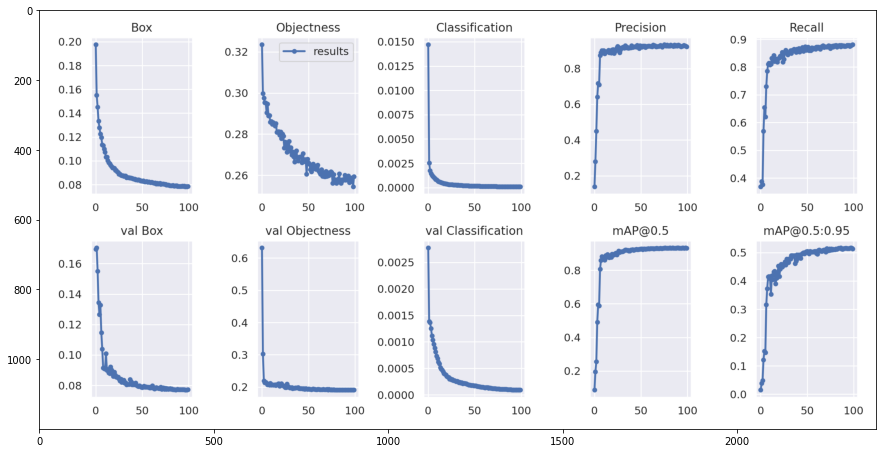

In [50]:
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread(f'runs/train/{exp}/results.png'))

## Get the best mAP and best epoch

In [51]:
!ls

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
Dockerfile   hubconf.py        train.py				  yolov5m.pt
LICENSE      models	       tutorial.ipynb			  yolov5m6.pt
README.md    my_data.yaml      utils				  yolov5x.pt
__pycache__  my_hyp.yaml       weights				  yolov5x6.pt
base_dir     requirements.txt  yolov5-v5.0-performance-graph.png
data	     runs	       yolov5l.pt
detect.py    test.py	       yolov5l6.pt


In [52]:
# Display the contents of the results.txt file

path = f'runs/train/{exp}/results.txt'

!cat $path

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
      0/99     21.4G    0.1976    0.3235   0.01471    0.5358      3619       512    0.1384    0.3683   0.08692   0.01506    0.1696    0.6318  0.002775
      1/99     22.7G    0.1552    0.2997  0.002545    0.4575      3657       512    0.2795     0.387     0.195   0.03869    0.1704    0.3022  0.001387
      2/99     22.7G    0.1451    0.2976  0.001733    0.4444      3741       512     0.449     0.376    0.2561   0.04889    0.1551    0.2196  0.001362
      3/99     22.7G    0.1333    0.2954  0.001467    0.4302      3634       512    0.6399    0.5688    0.4905    0.1218    0.1344    0.2141  0.001252
      4/99     22.7G    0.1278    0.2952   0.00129    0.4243      3925       512    0.7163    0.6547    0.5934    0.1521    0.1267    0.2145  0.001116
      5/99     22.7G    0.1226    0.2904  0.001165    0.4142      3652       512    0.7094    0.6199    0.5888     0.147    0.1327     0.212  0.001036
      6/99     22.7G

In [53]:
# Read the results from the training log: results.txt

# https://stackoverflow.com/questions/3277503/how-to-read-a-file-line-by-line-into-a-list
# https://stackoverflow.com/questions/65381312/how-to-convert-a-yolo-darknet-format-into-csv-file


filename = f'runs/train/{exp}/results.txt'

file_list = []

with open(filename) as f:
    # read a line into a list, format: ['item item item', 'item item item', ...]
    file_line_list = f.readlines()
    
    
for i in range(0, len(file_line_list)):
    
    # Get the first item in the list and split on the spaces.
    # This returns a list of all items in the line: ['item', 'item', 'item']
    line_list = file_line_list[i].split()
    
    # remove whitespace characters like `\n` at the end of each line
    line_list = [x.strip() for x in line_list]
    
    # Save the list.
    # all_lines_list is a list of lists
    file_list.append(line_list)
    
len(file_list)

100

In [54]:
# Put the file data into a dataframe

df = pd.DataFrame(file_list)

df.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0/99,21.4G,0.1976,0.3235,0.01471,0.5358,3619,512,0.1384,0.3683,0.08692,0.01506,0.1696,0.6318,0.002775
1,1/99,22.7G,0.1552,0.2997,0.002545,0.4575,3657,512,0.2795,0.387,0.195,0.03869,0.1704,0.3022,0.001387
2,2/99,22.7G,0.1451,0.2976,0.001733,0.4444,3741,512,0.449,0.376,0.2561,0.04889,0.1551,0.2196,0.001362
3,3/99,22.7G,0.1333,0.2954,0.001467,0.4302,3634,512,0.6399,0.5688,0.4905,0.1218,0.1344,0.2141,0.001252
4,4/99,22.7G,0.1278,0.2952,0.00129,0.4243,3925,512,0.7163,0.6547,0.5934,0.1521,0.1267,0.2145,0.001116
5,5/99,22.7G,0.1226,0.2904,0.001165,0.4142,3652,512,0.7094,0.6199,0.5888,0.147,0.1327,0.212,0.001036
6,6/99,22.7G,0.1195,0.2947,0.001054,0.4153,3799,512,0.8735,0.7298,0.8058,0.3159,0.1146,0.2075,0.0009593
7,7/99,22.7G,0.1136,0.2889,0.0009519,0.4035,4314,512,0.8899,0.7849,0.8578,0.3733,0.1039,0.2082,0.0008823
8,8/99,22.7G,0.1128,0.289,0.0008611,0.4027,3774,512,0.9009,0.8109,0.8805,0.4142,0.09141,0.2063,0.0008091
9,9/99,22.7G,0.1099,0.2859,0.000799,0.3966,4219,512,0.8867,0.8142,0.876,0.4158,0.09108,0.2117,0.0007349


In [55]:
# choose only the columns we want

col_names = ['epoch', 'P', 'R', 'map0.5', 'map0.5:0.95']

# filter out specific columns
df_results = df[[0, 8, 9, 10, 11]]

df_results.columns = col_names

# change the column names
df_results.head(10)

,epoch,P,R,map0.5,map0.5:0.95
0,0/99,0.1384,0.3683,0.08692,0.01506
1,1/99,0.2795,0.387,0.195,0.03869
2,2/99,0.449,0.376,0.2561,0.04889
3,3/99,0.6399,0.5688,0.4905,0.1218
4,4/99,0.7163,0.6547,0.5934,0.1521
5,5/99,0.7094,0.6199,0.5888,0.147
6,6/99,0.8735,0.7298,0.8058,0.3159
7,7/99,0.8899,0.7849,0.8578,0.3733
8,8/99,0.9009,0.8109,0.8805,0.4142
9,9/99,0.8867,0.8142,0.876,0.4158


In [56]:
# Get the best map0.5

best_map = df_results['map0.5'].max()

print('---------------------')

print('Best map0.5:', best_map)
print()

# print the row that contains the best map0.5
df = df_results[df_results['map0.5'] == best_map]

print(df.head())

print('---------------------')

---------------------
Best map0.5: 0.9329

    epoch       P       R  map0.5 map0.5:0.95
81  81/99  0.9266  0.8789  0.9329      0.5133
---------------------


## Display one batch of train images

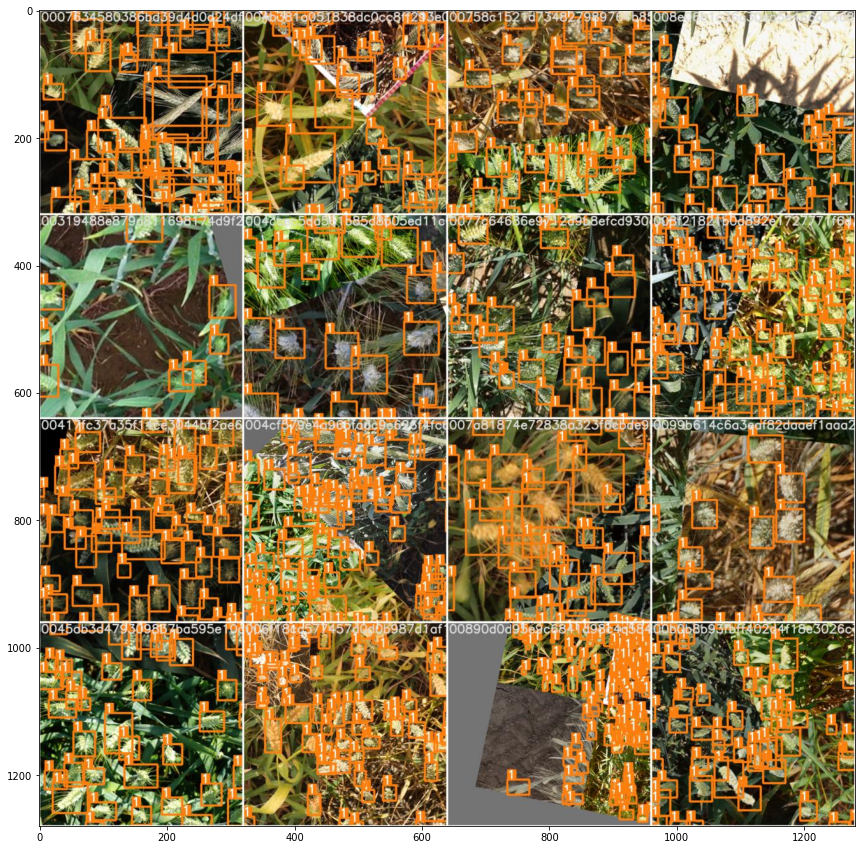

In [57]:
# Train
# One mosaic batch of train images with labels

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread(f'runs/train/{exp}/train_batch0.jpg'))

## Display true and predicted val set bboxes

Here we will display the true and predicted bboxes for two val batches.

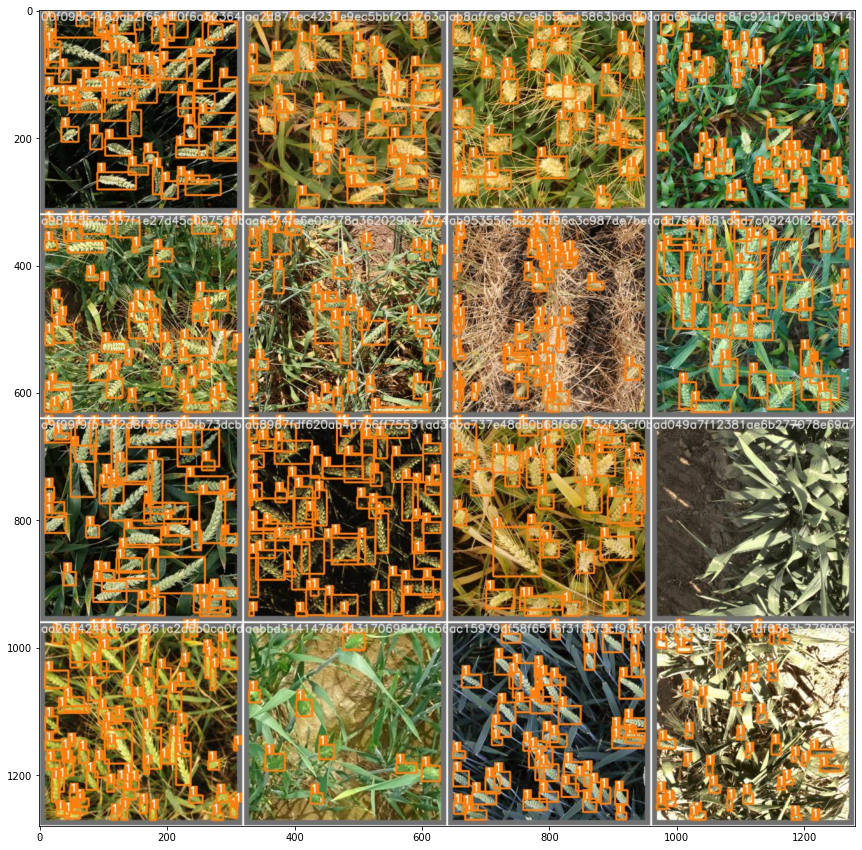

In [58]:
# BATCH 0 - TRUE BBOXES

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread(f'runs/train/{exp}/test_batch0_labels.jpg'))

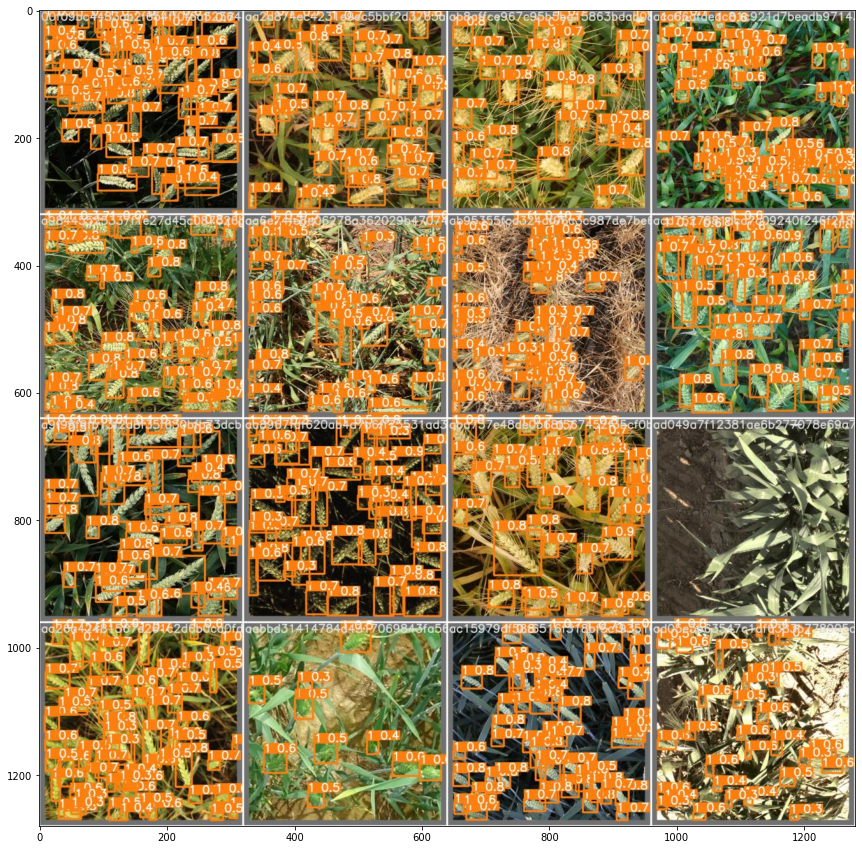

In [59]:
# BATCH 0 - PREDICTED BBOXES

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread(f'runs/train/{exp}/test_batch0_pred.jpg'))

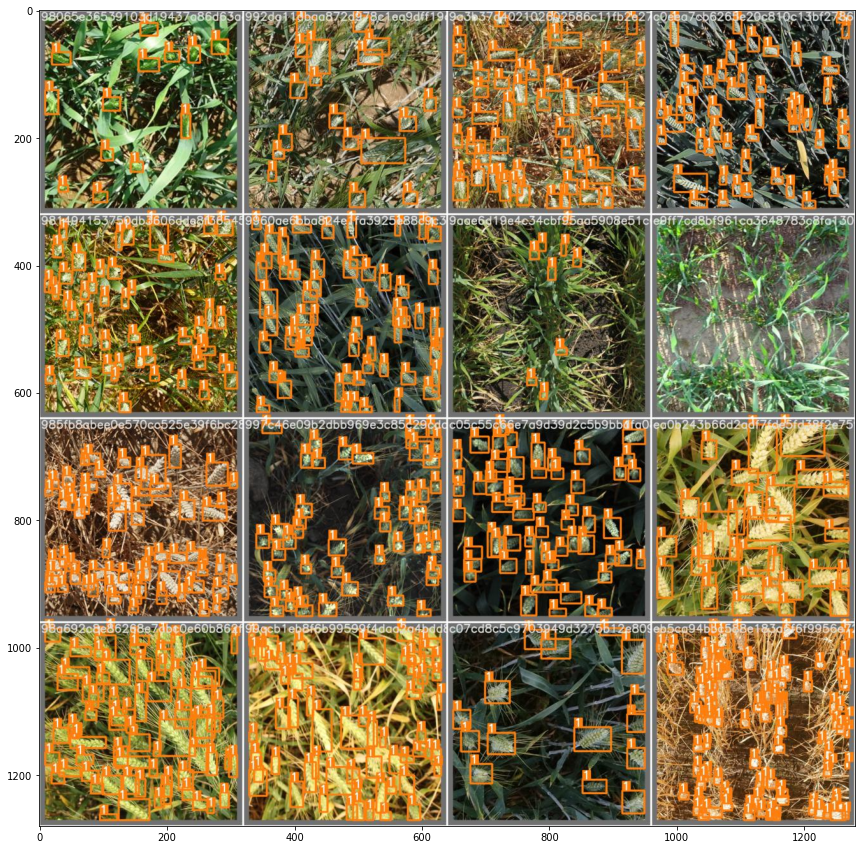

In [60]:
# BATCH 1 - TRUE BBOXES

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread(f'runs/train/{exp}/test_batch1_labels.jpg'))

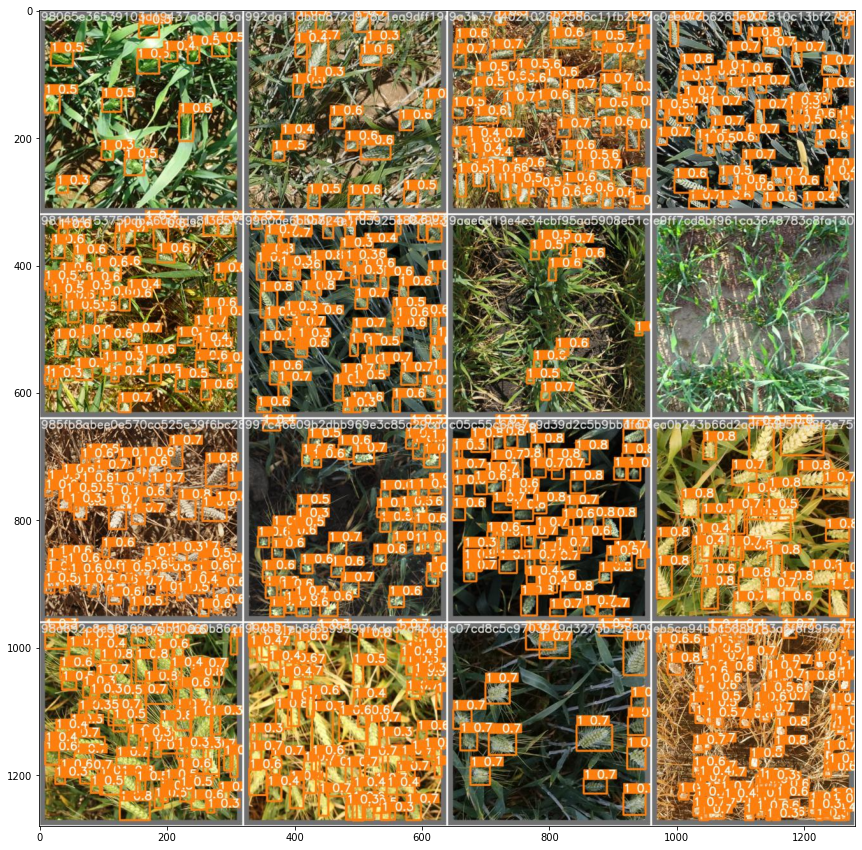

In [61]:
# BATCH 1 - PREDICTED BBOXES

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread(f'runs/train/{exp}/test_batch1_pred.jpg'))

## Make a prediction on the val set

In [62]:
# change the working directory
os.chdir(root)

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root


In [63]:
# Create a folder to store the extracted files
if os.path.isdir('yolo_images_dir') == False:
    yolo_images_dir = 'yolo_images_dir'
    os.mkdir(yolo_images_dir)
    
    
    
val_fname_list = list(df_val['image_id'])

for image_id in val_fname_list:
    
    fname = str(image_id) + IMG_EXT
    
    # Copy the image to images
    # Set the path to the images here.
    shutil.copyfile(
        f"{images_path}/{fname}",
        f"yolo_images_dir/{fname}")
    
    
len(os.listdir('yolo_images_dir'))

931

In [64]:
!ls

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
VAST_Setup_Notebook_for_GWHD.ipynb			   onstart.log
best.pt							   onstart.sh
exp05_df_rows_w_folds.csv				   ports.log
exp07-VAST-gwhd-yolov5-w-512-images-domain-stratifi.ipynb  requirements.txt
global-wheat-head-dataset-2021				   yolo_images_dir
input							   yolov5
my-yolov5-for-offline-use


In [65]:
# change the working directory
os.chdir(f'{root}/yolov5')

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root/yolov5


In [66]:
# Make a prediction on all images in images_dir

# The model only creates a txt file if it finds objects on an image.

test_images_path = f'{root}/yolo_images_dir'
yolo_model_path = f'{root}/best.pt'

# Ensembling two Yolo models
# How to ensemble Yolov5 models:
# Ref: https://github.com/ultralytics/yolov5/issues/318

!python detect.py --source $test_images_path --weights $yolo_model_path --img $IMAGE_SIZE --save-txt --save-conf --exist-ok


/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=True, img_size=512, iou_thres=0.45, name='exp', nosave=False, project='runs/detect', save_conf=True, save_txt=True, source='/root/yolo_images_dir', update=False, view_img=False, weights=['/root/best.pt'])
YOLOv5 🚀 2022-11-22 torch 1.12.0.dev20220327+cu113 CUDA:0 (NVIDIA RTX A5000, 24256.375MB)

Fusing layers... 
/usr/local/lib/python3.8/dist-packages/torch/functional.py:599: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2315.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 308 layers, 21041679 parameters, 0 gradients, 50.2 GFLOPS
image 1/931 /root/yolo_images_dir/00f09bc4483ab2f654ff0f6a3236442597dd67595320fa6c3984a9ab8c844c6d.png: 512x512 56 1s, Done. (0.011

## Process the predictions

In [67]:
txt_files_list = os.listdir('runs/detect/exp/labels')

print(len(txt_files_list))
print(txt_files_list[0])

913
00f09bc4483ab2f654ff0f6a3236442597dd67595320fa6c3984a9ab8c844c6d.txt


In [68]:
# Display the contents of the text file

# Note: Every time you run predict it appends the preds to the same txt file.
! cat 'runs/detect/exp/labels/77.txt'

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
cat: runs/detect/exp/labels/77.txt: No such file or directory


In [69]:
# Put the info inside all the txt files into one dataframe.
# Remember that if the image does not have any bounding boxes
# then Yolo does not create a txt file for it.

txt_files_list = os.listdir('runs/detect/exp/labels')

for i, txt_file in enumerate(txt_files_list):
    
    # set the path
    path = f'runs/detect/exp/labels/{txt_file}'
    
    # create a list of column names
    cols = ['class', 'x-center', 'y-center', 'bbox_width', 'bbox_height', 'conf-score']

    # put the file contents into a dataframe
    df = pd.read_csv(path, sep=" ", header=None)
    
    # add the column names to the datafrae
    df.columns = cols
    
    # Split the txt fname on the full stop and choose the first item 
    # in the list. The add the .jpg extension.
    # 87a0829f53c1.txt becomes 87a0829f53c1_image
    #fname = txt_file.split('.')[0] + '.png'
    fname = txt_file.replace(".txt", IMG_EXT)
    
    # add a new column with the fname
    df['id'] = fname
 
    # stack the dataframes for each txt file
    if i == 0:
        
        df_test_preds = df
    else:
        
        df_test_preds = pd.concat([df_test_preds, df], axis=0)
       
    
    
print(len(txt_files_list))
print(df_test_preds['id'].nunique())
print(df_test_preds.shape)

# Change the name of the dataframe
df_preds = df_test_preds.copy()

df_preds.head()

913
913
(39509, 7)


,class,x-center,y-center,bbox_width,bbox_height,conf-score,id
0,1,0.581055,0.013672,0.103516,0.027344,0.269287,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
1,1,0.790039,0.020019,0.154297,0.040039,0.274414,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
2,1,0.816895,0.892578,0.190430,0.097656,0.396240,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
3,1,0.982910,0.867188,0.034180,0.125000,0.422852,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
4,1,0.047852,0.161133,0.095703,0.169922,0.462891,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...


## Review the preds

In [70]:
# Create an image_id column

def get_image_id(x):
    
    image_id = x.split('.')[0]
    
    return image_id

df_preds['image_id'] = df_preds['id'].apply(get_image_id)

df_preds.head()

,class,x-center,y-center,bbox_width,bbox_height,conf-score,id,image_id
0,1,0.581055,0.013672,0.103516,0.027344,0.269287,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
1,1,0.790039,0.020019,0.154297,0.040039,0.274414,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
2,1,0.816895,0.892578,0.190430,0.097656,0.396240,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
3,1,0.982910,0.867188,0.034180,0.125000,0.422852,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...
4,1,0.047852,0.161133,0.095703,0.169922,0.462891,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...,00f09bc4483ab2f654ff0f6a3236442597dd67595320fa...


## Get the num true heads on each image

In [71]:
def get_num_bboxes(x):
    
    if x == 'no_box':
        return 0
    
    else:
    
        # Create a list of bbox coords.
        # Each list item is a string
        box_list = x.split(';')

        num_bboxes = len(box_list)

        return num_bboxes

df_val['num_bboxes'] = df_val['BoxesString'].apply(get_num_bboxes)

#df_val.head()

In [72]:
val_image_id_list = list(df_val['image_id'].unique())

num_list = []
domain_list = []

for image_id in val_image_id_list:
    
    df = df_val[df_val['image_id'] == image_id]
    df = df.reset_index(drop=True)
    
    num_boxes = df['num_bboxes'].sum()
    domain = df.loc[0, 'domain']
    
    num_list.append(num_boxes)
    domain_list.append(domain)

## Create df_boxes

In [73]:
info_dict = {
    'image_id': val_image_id_list,
    'domain': domain_list,
    'num_true_boxes': num_list
}

df_boxes = pd.DataFrame(info_dict)

df_boxes.head()

,image_id,domain,num_true_boxes
0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,Arvalis_1,43
1,68b0c06932935f8df33a351174e1e3ab0d6f058b64e4f9...,Arvalis_1,50
2,5fd9a56aa2620ccc0ef158d66cd5065c0c41b7dc897ff8...,Arvalis_1,52
3,bacd773ca3950074b36218aa5f1c477101a17ee83bb96c...,Arvalis_1,46
4,12421504268e0c36e905ea12119c44d3c3f19cbc2270ab...,Arvalis_1,50


In [74]:
df_boxes['domain'].value_counts()

ETHZ_1            107
Arvalis_3          84
Utokyo_1           77
Arvalis_5          67
Utokyo_2           65
Rres_1             62
Arvalis_2          57
Usask_1            29
Arvalis_4          29
Inrae_1            25
Arvalis_6          23
Terraref_1         19
Utokyo_3           19
NAU_3              15
Terraref_2         15
UQ_10              15
NAU_2              14
KSU_2              14
KSU_3              14
NMBU_2             14
KSU_1              14
UQ_11              12
NMBU_1             12
CIMMYT_1           10
CIMMYT_2           10
CIMMYT_3           10
Arvalis_1          10
Arvalis_11          9
KSU_4               8
Arvalis_10          8
Ukyoto_1            8
UQ_8                6
ARC_1               4
UQ_9                4
UQ_6                4
UQ_5                4
UQ_4                4
ULiège-GxABT_1      4
Arvalis_12          4
Arvalis_9           4
UQ_7                3
NAU_1               3
Arvalis_8           3
Arvalis_7           3
UQ_1                3
UQ_2      

## Add a column for the Development stage

In [94]:
# Load the metadata

path = base_path + 'metadata_dataset.csv'
df_meta = pd.read_csv(path, sep=';')

print(df_meta.shape)

df_meta.head()

(47, 4)


,name,country,location,development_stage
0,Ethz_1,Switzerland,Usask,Filling
1,Rres_1,UK,Rothamsted,Filling - Ripening
2,ULiège-GxABT_1,Belgium,Gembloux,Ripening
3,NMBU_1,Norway,NMBU,Filling
4,NMBU_2,Norway,NMBU,Ripening


In [95]:
# Convert the domain/name to lowercase e.g. Ethz_1 does not match ETHZ_1

def convert_to_lowercase(x):
    
    lower_str = x.lower()
    
    return lower_str


df_meta['name'] = df_meta['name'].apply(convert_to_lowercase)

df_boxes['domain'] = df_boxes['domain'].apply(convert_to_lowercase)


In [96]:
df_meta = df_meta.set_index('name')

dev_stage_list = []

for i in range(0, len(df_boxes)):
    
    domain = df_boxes.loc[i, 'domain']
    
    dev_stage = df_meta.loc[domain, 'development_stage']
    
    dev_stage_list.append(dev_stage)
    

df_boxes['dev_stage'] = dev_stage_list

df_boxes.head()

,image_id,domain,num_true_boxes,dev_stage
0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,arvalis_1,43,Post-flowering
1,68b0c06932935f8df33a351174e1e3ab0d6f058b64e4f9...,arvalis_1,50,Post-flowering
2,5fd9a56aa2620ccc0ef158d66cd5065c0c41b7dc897ff8...,arvalis_1,52,Post-flowering
3,bacd773ca3950074b36218aa5f1c477101a17ee83bb96c...,arvalis_1,46,Post-flowering
4,12421504268e0c36e905ea12119c44d3c3f19cbc2270ab...,arvalis_1,50,Post-flowering


In [97]:
df_boxes['dev_stage'].value_counts()

Filling               346
Filling - Ripening    256
Ripening              200
Post-flowering        102
multiple               19
Post-Flowering          8
Name: dev_stage, dtype: int64

## Add pred data to df_boxes

In [98]:
pred_image_id_list = list(df_preds['image_id'].unique())

num_list = []

for image_id in val_image_id_list:
    
    if image_id in pred_image_id_list:
        
        df = df_preds[df_preds['image_id'] == image_id]
        num_boxes = len(df)
        
        num_list.append(num_boxes)
        
    else:
        
        num_list.append(0)

In [99]:
df_boxes['num_pred_boxes'] = num_list

df_boxes.head()

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes
0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,arvalis_1,43,Post-flowering,49
1,68b0c06932935f8df33a351174e1e3ab0d6f058b64e4f9...,arvalis_1,50,Post-flowering,51
2,5fd9a56aa2620ccc0ef158d66cd5065c0c41b7dc897ff8...,arvalis_1,52,Post-flowering,53
3,bacd773ca3950074b36218aa5f1c477101a17ee83bb96c...,arvalis_1,46,Post-flowering,48
4,12421504268e0c36e905ea12119c44d3c3f19cbc2270ab...,arvalis_1,50,Post-flowering,50


## Analyze df_boxes

In [100]:
df_boxes['diff'] = abs(df_boxes['num_true_boxes'] - df_boxes['num_pred_boxes'])
df_boxes['perc_diff'] = df_boxes['diff']/df_boxes['num_true_boxes']

# Remove the rows with no true boxes
df = df_boxes[df_boxes['num_true_boxes'] != 0]

#df.head()

## Get the mean percentage difference

In [101]:
df['perc_diff'].mean()

0.09100061756823818

## Group by domain

In [102]:
df_domains = df.groupby('domain').mean()

# Only show certain columns
cols = ['diff', 'perc_diff']
df_domains = df_domains[cols]

# Sort by percentage diff
df_domains = df_domains.sort_values(by=['perc_diff'])

In [103]:
domain_list = list(df_domains.index)

dev_list = []
country_list = []
location_list = []

for domain in domain_list:
    
    dev_stage = df_meta.loc[domain, 'development_stage']
    country = df_meta.loc[domain, 'country']
    location = df_meta.loc[domain, 'location']
    
    dev_list.append(dev_stage)
    country_list.append(country)
    location_list.append(location)
    
    
df_domains['dev_stage'] = dev_list
df_domains['country'] = country_list
df_domains['location'] = location_list

df_domains.head(100)

,diff,perc_diff,dev_stage,country,location
domain,,,,,
nau_2,1.000000,0.023612,Post-flowering,China,Baima
arvalis_7,1.333333,0.029724,Filling - Ripening,France,VLB
arvalis_6,2.000000,0.041701,Filling - Ripening,France,VSC
cimmyt_2,1.700000,0.048701,Post-flowering,Mexico,Ciudad Obregon
ksu_2,2.714286,0.048844,Post-flowering,US,KSU
arvalis_9,3.250000,0.050163,Ripening,France,VLB
nmbu_1,4.500000,0.050437,Filling,Norway,NMBU
uq_7,4.000000,0.053276,Ripening,Australia,Gatton
arvalis_10,1.250000,0.054295,Filling,France,Mons


## Mean precentage diff

In [104]:
df['perc_diff'].mean()

0.09100061756823818

## Sort df_boxes by perc_diff

In [105]:
# Sort by percentage diff
df_sorted = df.sort_values(by=['perc_diff'])

df_sorted = df_sorted.reset_index(drop=True)

df_sorted.head(20)

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes,diff,perc_diff
0,5269da245c1527bffc8b5161a3f33b6423de1a1a4ce62e...,usask_1,24,Filling - Ripening,24,0,0.0
1,ddc29ea8e3fd1004614bab4325a72bf7e8758d91abf136...,utokyo_1,27,Ripening,27,0,0.0
2,02d23af574ce0e0c8bf6743ab2161e5de9c9e58d4d2407...,utokyo_1,31,Ripening,31,0,0.0
3,1c687cb8210cc00407daa61efe1be50368e0301945c9b9...,usask_1,37,Filling - Ripening,37,0,0.0
4,71cd1c5d806887ca37c6ab90722d37aeabd2cc7ec6bf3d...,arvalis_4,18,Filling,18,0,0.0
5,f12c942476f17d24968156c1f37d6a5f376c56ed3e5df4...,rres_1,31,Filling - Ripening,31,0,0.0
6,215e55bd7cb71a21a8c39938a5b3c5ad7f0a6609825a6f...,arvalis_3,50,Filling - Ripening,50,0,0.0
7,a58a6ffa93e9cea29f156596f781f13d6e9c6eff87faf6...,rres_1,59,Filling - Ripening,59,0,0.0
8,7d85cdfcca458a2a98edcddafced070682e58d5dce0826...,rres_1,35,Filling - Ripening,35,0,0.0
9,d2e7a487f62e94a7f9bdc9e419491649763d230e7b2e8c...,arvalis_5,38,Filling,38,0,0.0


In [106]:
df_sorted .tail(50)

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes,diff,perc_diff
863,dd5c0925d61fc2a4f9b88d7536ef64d7b4c8c7651034ae...,terraref_2,21,Filling,16,5,0.238095
864,cbabc8b8b027ce1365530a54e241c10c66d945b928661a...,usask_1,25,Filling - Ripening,31,6,0.240000
865,a220e591681c7236f18757cfbf85818261c1d2085fbf69...,ukyoto_1,57,Post-Flowering,43,14,0.245614
866,83a349ee7a0f246b531701d3a204aff29552501d526582...,utokyo_1,4,Ripening,5,1,0.250000
867,9519cbca9c30ac6e5f862e959d48110f2c1ab1d5ec7cc0...,utokyo_2,20,Ripening,25,5,0.250000
868,aabbd31414784d4317069843fa565ece52c122fe71e7f0...,utokyo_3,8,multiple,10,2,0.250000
869,8f34acefa82d16269858fd9e017e8001ec8e4c25a1d8a6...,ksu_3,60,Filling,75,15,0.250000
870,5661a9fa96878dce3615c40405f8bec8d9de3bf66da76b...,terraref_1,20,Ripening,15,5,0.250000
871,34fdd48674160e2f41727b9a80174b6be46e0ab9eb23ee...,arvalis_5,4,Filling,5,1,0.250000
872,ba4995146f6e0d6bdc24571d73bf603cfb50058542f34f...,terraref_1,44,Ripening,33,11,0.250000


## How to display an image with true and pred boxes

In [128]:
chosen_image_id = 906

image_id = df_sorted.loc[chosen_image_id, 'image_id']

# Load the image

# Get the path
path = base_path + 'images/' + image_id +'.png'

image = cv2.imread(path)

# Convert from BGR to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display a large image
#plt.figure(figsize=(10,10))

#plt.imshow(image)

12


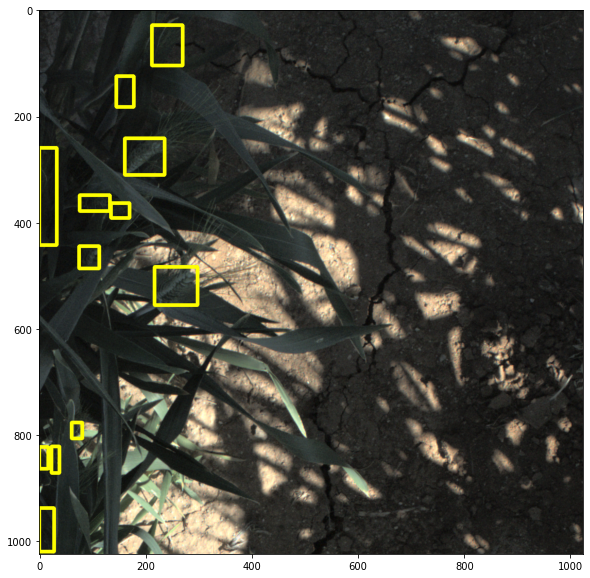

In [129]:
df1 = df_val[df_val['image_id'] == image_id]

df1 = df1.reset_index(drop=True)

box_list = list(df1[ 'boxes'])

print(len(box_list))

for coords_dict in box_list:
    
    # Don't need this line on VAST
    #coords_dict = ast.literal_eval(coords_dict)
    
    xmin = coords_dict['x']
    ymin = coords_dict['y']
    height = coords_dict['height']
    width = coords_dict['width']
    
    xmax = xmin + width
    ymax = ymin + height
    
    # Draw the bbox on the image
    start_point = (xmin, ymin) 
    end_point = (xmax, ymax) 
    bbox_color = (255, 255, 0) 
    bbox_thickness = 5

    image = cv2.rectangle(image, start_point, end_point, bbox_color, bbox_thickness)

# Display a large image
plt.figure(figsize=(10,10))

plt.imshow(image)

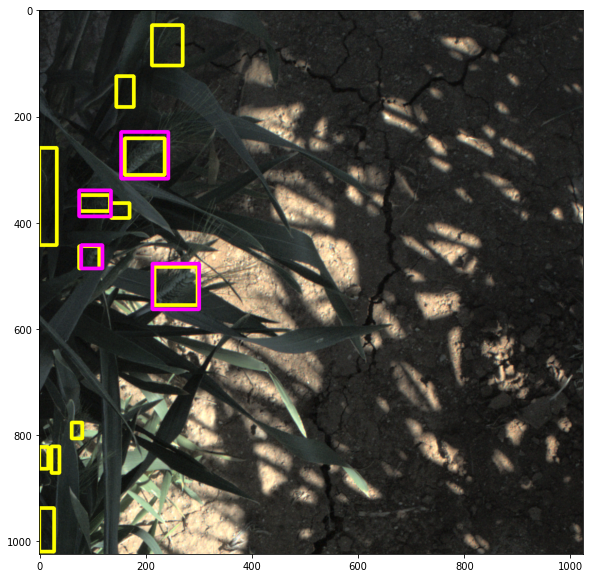

In [130]:
df2 = df_preds[df_preds['image_id'] == image_id]

df2 = df2.reset_index(drop=True)

orig_image_h = 1024
orig_image_w = 1024


for j in range(0, len(df2)):

    w = int(df2.loc[j,'bbox_width'] * orig_image_w)
    h = int(df2.loc[j,'bbox_height'] * orig_image_h)

    x_cent = orig_image_w * df2.loc[j,'x-center']
    y_cent = orig_image_h * df2.loc[j,'y-center']

    xmin = int(x_cent - (w / 2))
    ymin = int(y_cent - (h / 2))

    xmax = xmin + w
    ymax = ymin + h
    
    # Draw the bbox on the image
    start_point = (xmin, ymin) 
    end_point = (xmax, ymax) 
    bbox_color = (255, 0, 255) 
    bbox_thickness = 5

    image = cv2.rectangle(image, start_point, end_point, bbox_color, bbox_thickness)
    

# Display a large image
plt.figure(figsize=(10,10))

plt.imshow(image)

## Save df_sorted

In [110]:
path = 'df_sorted.csv'
df_sorted.to_csv(path, index=False)

## Delete images to prevent notebook commit errors

In [111]:
# change the working directory to yolov5

os.chdir(f'{root}/yolov5')

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root/yolov5


In [112]:
# Delete the folder to prevent a Kaggle error.

if os.path.isdir('base_dir') == True:
    shutil.rmtree('base_dir')

In [113]:
# change the working directory

os.chdir(root)

!pwd

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
/root


In [114]:
!pip  freeze > requirements.txt

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)


In [115]:
!ls

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
VAST_Setup_Notebook_for_GWHD.ipynb			   onstart.log
best.pt							   onstart.sh
exp05_df_rows_w_folds.csv				   ports.log
exp07-VAST-gwhd-yolov5-w-512-images-domain-stratifi.ipynb  requirements.txt
global-wheat-head-dataset-2021				   yolo_images_dir
input							   yolov5
my-yolov5-for-offline-use
